# CSCI 632 Project

# **Contributors: Peter Van Ness and Noah Langendoen**

# **Introduction**

**Leaf Classification:**

https://www.kaggle.com/c/leaf-classification


For this project we will be creating a classification model that is able to predict which species a leaf belongs to based on extracted features provided in a dataset. Extracted features include margins, textures, and shapes of leaves. The kaggle link above provides four files. We will only be handling train.csv, as the test.csv file is unlabled, meaning we are not able to verify our predictions on this data. It also provides images of leaves that we will not be working with because the training set provides sufficiently labeled data. We will try techniques such as logistic regression, support vector classifier (SVC), random forests, XGBoost, and a PyTorch Neural Network.


---

Data visualizations and data exploration was performed by both members.

Model development splits:


*   Peter Van Ness: Logistic Regression, Neural Network
*   Noah Langendoen: SVC, XGBoost, Random Forests



# **Data Exploration**

In [ ]:
#Install for hierarchical clustering
!pip install fastcluster

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.0/194.0 kB 8.1 MB/s eta 0:00:00


In [ ]:
#Imports
import zipfile
import os
import warnings
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy import stats
from scipy.cluster.hierarchy import linkage, dendrogram


#Making pandas show all rows for data visualization
# pd.set_option('display.max_rows', None)

In [ ]:
#Storing filenames in a zip
files_to_unzip = ["train.csv.zip"]

extract_directory = "unzipped"
os.makedirs(extract_directory, exist_ok=True)

#Unzipping each file
for files in files_to_unzip:
    with zipfile.ZipFile(files, 'r') as zip_ref:
        zip_ref.extractall(extract_directory)


In [ ]:
#Creating dataframes
train_df = pd.read_csv('unzipped/train.csv')

In [ ]:
#Checking the amount of data and number of columns
print(f'Rows of train_df: {train_df.shape[0]}\nColumns of train_df: {train_df.shape[1]}')

Rows of train_df: 990
Columns of train_df: 194


In [ ]:
train_df.head()

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.0,0.0,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.0,0.0,0.000977,0.039062,0.022461
2,3,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.0,0.0,0.000000,0.020508,0.002930
3,5,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.0,0.0,0.017578,0.000000,0.047852
4,6,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.031250


In [ ]:
train_df.describe()

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,...,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,799.595960,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,0.007167,...,0.036501,0.005024,0.015944,0.011586,0.016108,0.014017,0.002688,0.020291,0.008989,0.019420
std,452.477568,0.019739,0.038855,0.025847,0.028411,0.018390,0.052030,0.017511,0.002743,0.008933,...,0.063403,0.019321,0.023214,0.025040,0.015335,0.060151,0.011415,0.039040,0.013791,0.022768
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,415.250000,0.001953,0.001953,0.013672,0.005859,0.001953,0.000000,0.005859,0.000000,0.001953,...,0.000000,0.000000,0.000977,0.000000,0.004883,0.000000,0.000000,0.000000,0.000000,0.000977
50%,802.500000,0.009766,0.011719,0.025391,0.013672,0.007812,0.015625,0.015625,0.000000,0.005859,...,0.004883,0.000000,0.005859,0.000977,0.012695,0.000000,0.000000,0.003906,0.002930,0.011719
75%,1195.500000,0.025391,0.041016,0.044922,0.029297,0.017578,0.056153,0.029297,0.000000,0.007812,...,0.043701,0.000000,0.022217,0.009766,0.021484,0.000000,0.000000,0.023438,0.012695,0.029297
max,1584.000000,0.087891,0.205080,0.156250,0.169920,0.111330,0.310550,0.091797,0.031250,0.076172,...,0.429690,0.202150,0.172850,0.200200,0.106450,0.578130,0.151370,0.375980,0.086914,0.141600


In [ ]:
#Checking unique number of species
len(train_df['species'].unique())

99

In [ ]:
#Seeing how many of each species exist in the dataframe
train_df.groupby('species').size()

,0
species,
Acer_Capillipes,10
Acer_Circinatum,10
Acer_Mono,10
Acer_Opalus,10
Acer_Palmatum,10
...,...
Tilia_Tomentosa,10
Ulmus_Bergmanniana,10
Viburnum_Tinus,10


In [ ]:
#Checking the amount of outliers within the dataset - may not be worth handling since data is likely true
for column in train_df.columns:
    if column != 'species':

        Q1 = train_df[column].quantile(0.25)
        Q3 = train_df[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = train_df[(train_df[column] < lower_bound) | (train_df[column] > upper_bound)]
        print(f"Feature '{column}' has {outliers.shape[0]} outliers.")


Feature 'id' has 0 outliers.
Feature 'margin1' has 41 outliers.
Feature 'margin2' has 78 outliers.
Feature 'margin3' has 41 outliers.
Feature 'margin4' has 74 outliers.
Feature 'margin5' has 92 outliers.
Feature 'margin6' has 62 outliers.
Feature 'margin7' has 21 outliers.
Feature 'margin8' has 185 outliers.
Feature 'margin9' has 78 outliers.
Feature 'margin10' has 21 outliers.
Feature 'margin11' has 10 outliers.
Feature 'margin12' has 11 outliers.
Feature 'margin13' has 15 outliers.
Feature 'margin14' has 149 outliers.
Feature 'margin15' has 4 outliers.
Feature 'margin16' has 13 outliers.
Feature 'margin17' has 17 outliers.
Feature 'margin18' has 28 outliers.
Feature 'margin19' has 46 outliers.
Feature 'margin20' has 23 outliers.
Feature 'margin21' has 14 outliers.
Feature 'margin22' has 121 outliers.
Feature 'margin23' has 81 outliers.
Feature 'margin24' has 105 outliers.
Feature 'margin25' has 57 outliers.
Feature 'margin26' has 21 outliers.
Feature 'margin27' has 135 outliers.
Feat

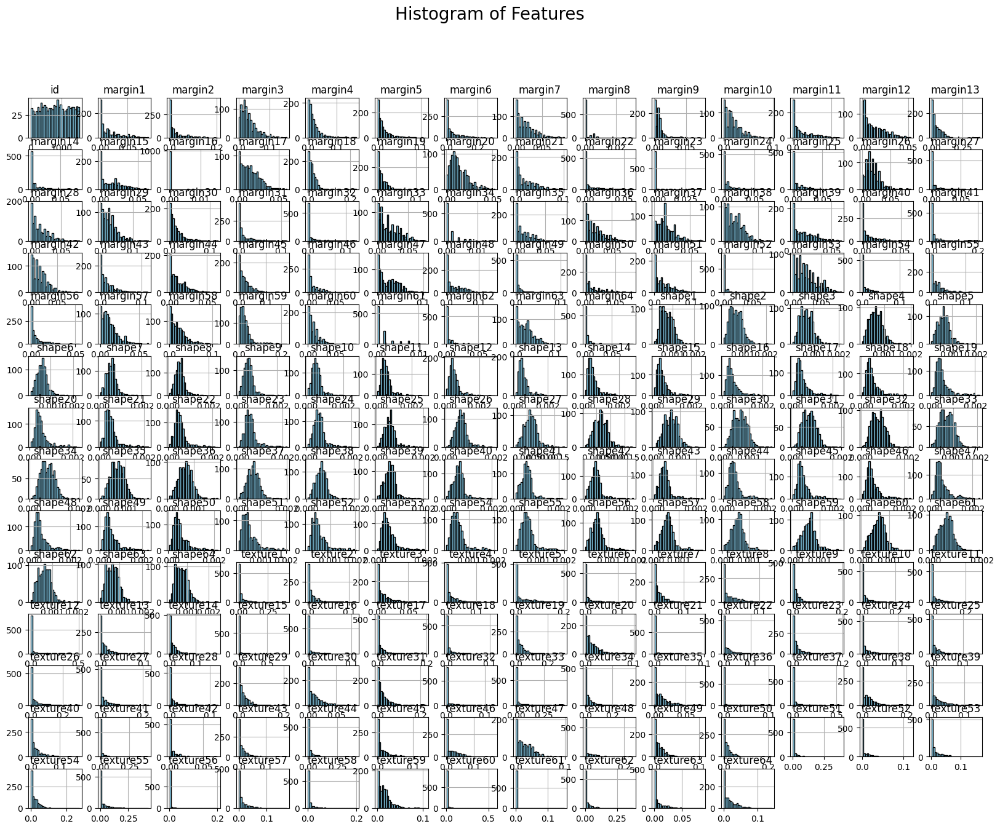

In [ ]:
#Checking distributions of features using histograms
train_df.hist(bins=30, figsize=(20, 15), color='skyblue', edgecolor='black')
plt.suptitle("Histogram of Features", fontsize=20)
plt.show()

From this data we are able to see that there is a lot of skewed features. This will be handled in the **Preprocessing** section.

In [ ]:
df = pd.read_csv('unzipped/train.csv')

# Filter out the labels and the id, both are redundent for correlation, and calculate correlation matrix
corr_mat = df.drop(columns=['id', 'species']).corr()

# Filter out values with below our correlation threshold (0.9 currently)
corr_mat_filtered = corr_mat[corr_mat.abs() > 0.9]

# This has an issue where a lot of values are NaN, we want to get rid of rows only containing NaN
# No rows like this exist because (i, i) will always be 1.0, so we will change all diagnols to NaN temporarily

np.fill_diagonal(corr_mat_filtered.values, np.nan)
corr_mat_filtered = corr_mat_filtered.dropna(axis=0, how='all')
corr_mat_filtered = corr_mat_filtered.dropna(axis=1, how='all')
np.fill_diagonal(corr_mat_filtered.values, 1)

corr_mat_filtered

,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,...,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64
shape1,1.000000,0.988172,0.963959,0.928501,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.940542,0.968368,0.988632
shape2,0.988172,1.000000,0.989348,0.962662,0.919347,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.931919,0.953427,0.969233
shape3,0.963959,0.989348,1.000000,0.988259,0.956976,0.909099,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.920399,0.933826,0.944059
shape4,0.928501,0.962662,0.988259,1.000000,0.987085,0.953611,0.902544,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.901089,0.905258,0.909143
shape5,NaN,0.919347,0.956976,0.987085,1.000000,0.986204,0.949721,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
shape60,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.943021,0.984161,1.000000,0.985344,0.952775,0.909922,NaN
shape61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.946870,0.985344,1.000000,0.987568,0.958438,0.923810
shape62,0.940542,0.931919,0.920399,0.901089,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.952775,0.987568,1.000000,0.988180,0.962985
shape63,0.968368,0.953427,0.933826,0.905258,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.909922,0.958438,0.988180,1.000000,0.988744


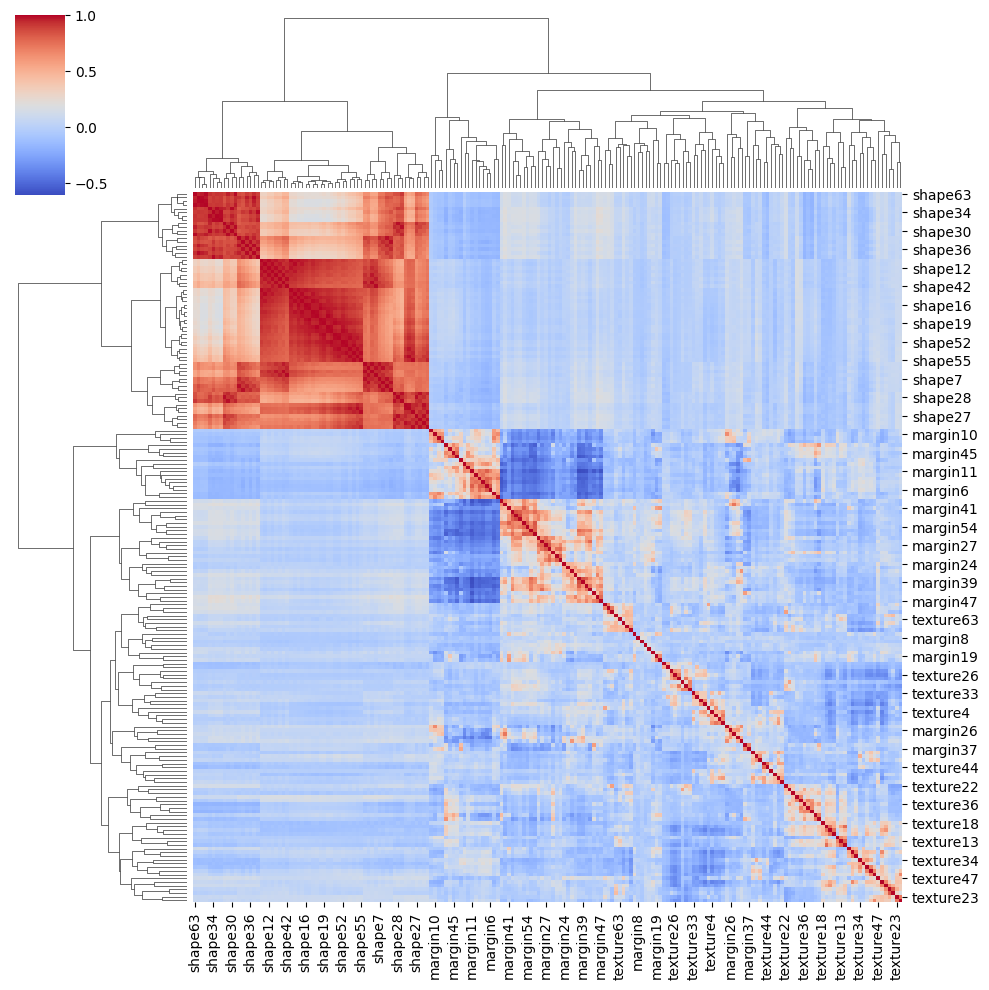

In [ ]:
# The filtered correlation matrix required too high of a threshold to be meaningful, lets use the full matrix
# and visualize it using hierarchical clustering

corr_linkage = linkage(corr_mat, method='ward')  # Hierarchical clustering
sns.clustermap(corr_mat, annot=False, cmap='coolwarm')
plt.show()

In [ ]:
# Lets just try a normal heatmap, it's easier to read
fig = plt.figure(figsize=(36, 36), dpi=480)
sns.heatmap(corr_mat, annot=False, cmap='coolwarm')
plt.show()

Shapes have a high correlation as seen in the visualization above. There is also exists correlations between some textures, as well as between some margins. It does appear that shapes, textures, and margins have little-to-no correlation to each other. The hierarchical clustering shows the negative correlations between some of the margins well

# **Preprocessing**

In [ ]:
#Remove ID from dataframes as they should provide no correlation to the classification
train_df = train_df.drop(columns=['id'])

There are no missing values in the dataframe.



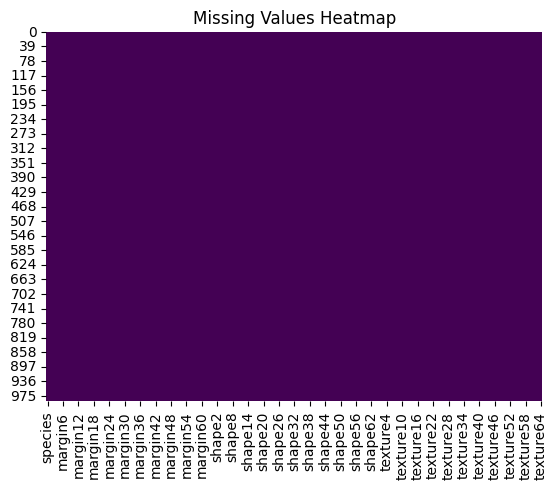

In [ ]:
#Check if there are any missing values in the entire dataframe
missing = train_df.isnull().values.any()

#Creating a plot to visualize where values might be missing
sns.heatmap(train_df.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")

#If there are missing values print the columns that contain the missing values and the amount of values missing
if missing:
    missing_all = train_df.isnull().sum()
    missing_all = missing_all[missing_all > 0]
    print(missing_all)
else:
    print("There are no missing values in the dataframe.\n")

plt.show()

In [ ]:
#Checking for duplicated rows and dropping the duplicated rows if they exist
duplicated = train_df.duplicated().sum()

if duplicated > 0:
    train_df = train_df.drop_duplicates()
    print(f"The duplicated rows have been removed from the dataframe.")
else:
    print("There are no duplicated rows in the dataframe.")

There are no duplicated rows in the dataframe.


Performing a Box Cox transformation on the data since the traditional log transformation was unsuccessful. This works for our data since all values are > 0. However, we did add a small integer (1) to the transformation to help resolve issues that may arise for values = 0.

In [ ]:
#Handling skewness for some future models and saving in a transformed df
transformed_df = train_df.copy()

for column in train_df.columns:
    if column != 'species':
        skewness = train_df[column].skew()
        if skewness > 1:
            transformed_df[column], _ = stats.boxcox(train_df[column] + 1)

Visualization for the skewness before vs after the Box Cox transformation.

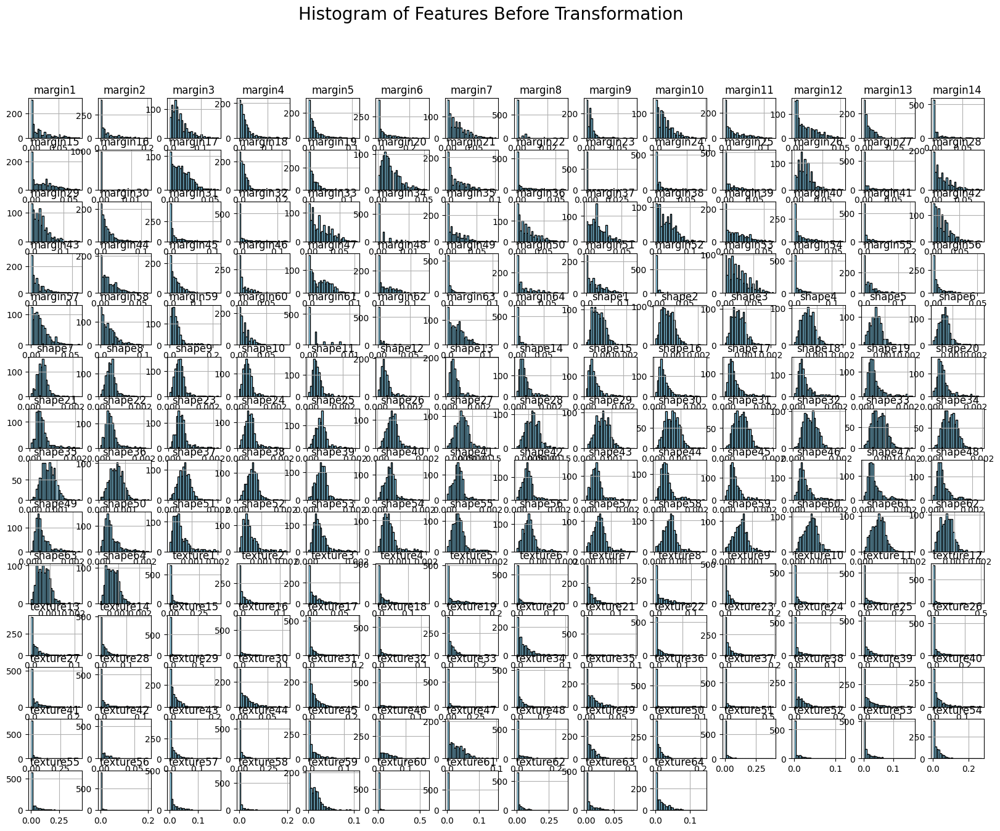

In [ ]:
#Checking distributions of features using histograms for train_df
train_df.hist(bins=30, figsize=(20, 15), color='skyblue', edgecolor='black')
plt.suptitle("Histogram of Features Before Transformation", fontsize=20)
plt.show()

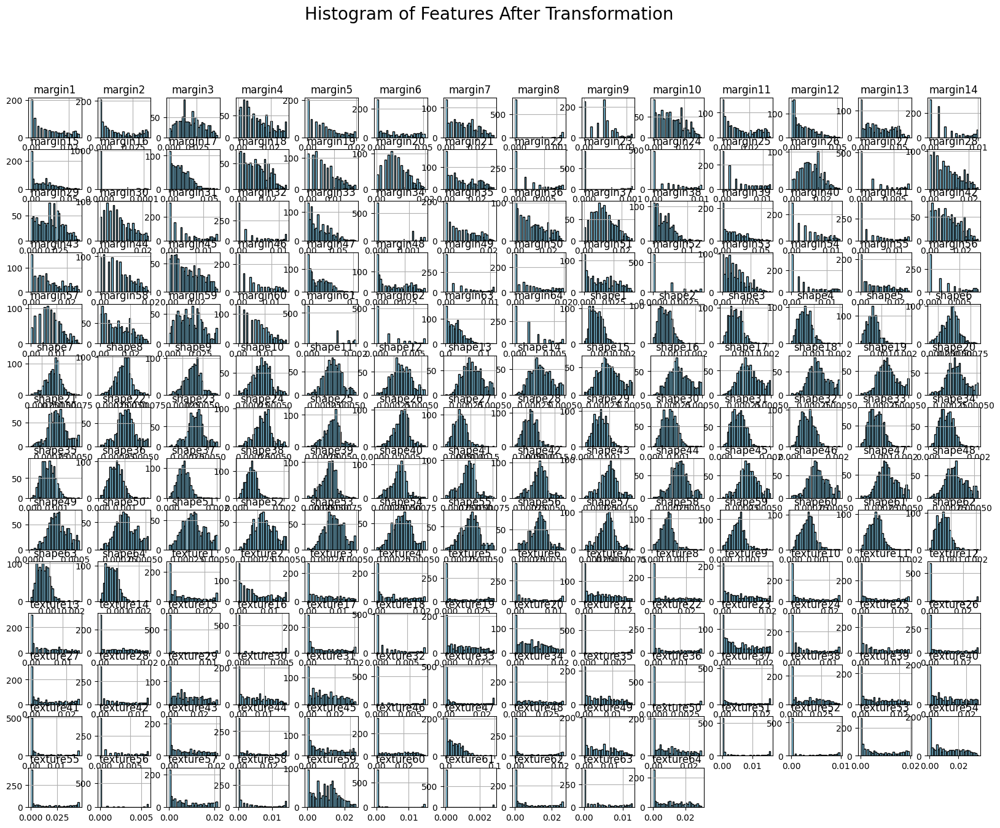

In [ ]:
#Checking distributions of features using histograms for transformed_df
transformed_df.hist(bins=30, figsize=(20, 15), color='skyblue', edgecolor='black')
plt.suptitle("Histogram of Features After Transformation", fontsize=20)
plt.show()

# **Model Building and Hyperparameter Tuning**

**Model Ideas:**


*   Logistic Regression
*   Random Forests
*   XGBoost
*   SVM
*   Neural Network



**Model Imports**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, MinMaxScaler, StandardScaler
import tensorflow as tf
import matplotlib.pyplot as plt

**Model 1: Logistic Regression**

In [ ]:
#Performing the data split of the dataframes for Random Forests
X = train_df.drop(columns=['species'])
y = train_df['species']

X_transformed = transformed_df.drop(columns=['species'])
y_transformed = transformed_df['species']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train_transformed, X_test_transformed, y_train_transformed, y_test_transformed = train_test_split(X_transformed, y, test_size=0.2, random_state=42)

In [ ]:
log_model = LogisticRegression()
log_model.fit(X_train, y_train)

y_pred = log_model.predict(X_test)

#Evaluate the model's accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy of the Logistic Regression Model: {accuracy * 100:.2f}%")

Accuracy of the Logistic Regression Model: 12.12%


**Model 2: Random Forests**

In [ ]:
#Performing the data split of the dataframes for Random Forests
X = train_df.drop(columns=['species'])
y = train_df['species']

X_transformed = transformed_df.drop(columns=['species'])
y_transformed = transformed_df['species']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.35, random_state=42)

X_train_transformed, X_test_transformed, y_train_transformed, y_test_transformed = train_test_split(X_transformed, y_transformed, test_size=0.2, random_state=42)

In [ ]:
#Basic random forest model performed on train_df
rf_model = RandomForestClassifier(random_state=42)

#Train the model
rf_model.fit(X_train, y_train)

#Predict on the test set
y_pred = rf_model.predict(X_test)

#Evaluate the model's accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy of the Random Forest Model: {accuracy * 100:.2f}%")

Accuracy of the Random Forest Model: 95.97%


In [ ]:
#Basic random forest model performed on transformed_df
rf_model = RandomForestClassifier(random_state=42)

#Train the model
rf_model.fit(X_train_transformed, y_train_transformed)

#Predict on the test set
y_pred_transformed = rf_model.predict(X_test_transformed)

#Evaluate the model's accuracy
accuracy = accuracy_score(y_test_transformed, y_pred_transformed)
print(f"Accuracy of the Random Forest Transformed Model: {accuracy * 100:.2f}%")

Accuracy of the Random Forest Transformed Model: 96.97%


In [ ]:
#Creating the random forest model
rf_model = RandomForestClassifier(random_state=42)

param_grid = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [None, 10, 30, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    }


grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

grid_search.fit(X_train_transformed, y_train_transformed)

best_rf_model = grid_search.best_estimator_

y_pred_transformed = best_rf_model.predict(X_test_transformed)

accuracy = accuracy_score(y_test_transformed, y_pred_transformed)

print(f"Accuracy of the Random Forest Model after Grid Search: {accuracy * 100:.2f}%")
print("Best hyperparameters from Grid Search:", grid_search.best_params_)


Fitting 5 folds for each of 144 candidates, totalling 720 fits
Accuracy of the Random Forest Model after Grid Search: 97.98%
Best hyperparameters from Grid Search: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}


In [ ]:
#Model tuned from the hyperparameter training performed above using Grid Search
rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    min_samples_leaf=1,
    min_samples_split=2,
    random_state=42
    )

#Train the model
rf_model.fit(X_train_transformed, y_train_transformed)

#Predict on the test set
y_pred_transformed = rf_model.predict(X_test_transformed)

#Evaluate the model's accuracy
accuracy = accuracy_score(y_test_transformed, y_pred_transformed)
print(f"Accuracy of the Random Forest Transformed Model: {accuracy * 100:.2f}%")

Accuracy of the Random Forest Transformed Model: 97.98%


**Model 3: XGBoost**

In [ ]:
label_encoder = LabelEncoder()

y_encoded = label_encoder.fit_transform(train_df['species'])
y_transformed_encoded = label_encoder.transform(transformed_df['species'])

X = train_df.drop(columns=['species'])
X_transformed = transformed_df.drop(columns=['species'])

X_train, X_test, y_train_encoded, y_test_encoded = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

X_train_transformed, X_test_transformed, y_train_transformed, y_test_transformed = train_test_split(X_transformed, y_transformed_encoded, test_size=0.2, random_state=42)

In [ ]:
#Basic XGBoost model performed on train_df
xgb_model = xgb.XGBClassifier(random_state=42)

#Train the model
xgb_model.fit(X_train, y_train_encoded)

#Predict on the test set
y_pred = xgb_model.predict(X_test)

#Evaluate the model's accuracy
accuracy = accuracy_score(y_test_encoded, y_pred)
print(f"Accuracy of the XGBoost Model: {accuracy * 100:.2f}%")

Accuracy of the XGBoost Model: 84.85%


In [ ]:
#Basic XGBoost model performed on transformed_df
xgb_model = xgb.XGBClassifier(random_state=42)

#Train the model
xgb_model.fit(X_train_transformed, y_train_transformed)

#Predict on the test set
y_pred_transformed = xgb_model.predict(X_test_transformed)

#Evaluate the model's accuracy
accuracy = accuracy_score(y_test_transformed, y_pred_transformed)
print(f"Accuracy of the XGBoost Model: {accuracy * 100:.2f}%")

Accuracy of the XGBoost Model: 84.85%


In [ ]:
#Creating the XGBoost model
xgb_model = xgb.XGBClassifier(random_state=42)

#Creating the hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.8, 0.9, 1.0],
}

grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=3, scoring='accuracy', verbose=1, n_jobs=-1)

grid_search.fit(X_train, y_train_encoded)

best_params = grid_search.best_params_
best_score = grid_search.best_score_

best_model = grid_search.best_estimator_

y_pred = best_model.predict(X_test)

accuracy = accuracy_score(y_test_encoded, y_pred)

print(f"Accuracy of the XGBoost Model after Grid Search: {accuracy * 100:.2f}%")
print("Best hyperparameters from Grid Search:", grid_search.best_params_)

Fitting 3 folds for each of 81 candidates, totalling 243 fits
Accuracy of the XGBoost Model after Grid Search: 90.40%
Best hyperparameters from Grid Search: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}


Not satisfied with the results of what we believe XGBoost could achieve. Will test some hyperparameters by hand that are more important to the models training.

In [ ]:
learning_rates = [round(i*.1, 1) for i in range(1, 11)]
max_depths = [i for i in range(1, 11)]

results = []

for lr in learning_rates:
    for depth in max_depths:
        xgb_model = xgb.XGBClassifier(random_state=42, learning_rate=lr, max_depth=depth)
        xgb_model.fit(X_train, y_train_encoded)
        y_pred = xgb_model.predict(X_test)
        accuracy = accuracy_score(y_test_encoded, y_pred)
        results.append((lr, depth, accuracy * 100))

best_learning, best_depth, best_accuracy = max(results, key=lambda x: x[2])

print(f"Learning Rate: {best_learning} Max Depth: {best_depth} Accuracy: {best_accuracy:.2f}%")

Learning Rate: 0.3 Max Depth: 1 Accuracy: 89.90%


Obtaining the best values for learning rate and max depth above, we will continue testing on another hyperparameter that can heavily influence the accuracy.

In [ ]:
subsamples = [round(i*.1, 1) for i in range(1, 11)]

results = []

for subsample in subsamples:
    xgb_model = xgb.XGBClassifier(random_state=42, learning_rate=0.3, max_depth=1, subsample=subsample)
    xgb_model.fit(X_train_transformed, y_train_transformed)
    y_pred_transformed = xgb_model.predict(X_test_transformed)
    accuracy = accuracy_score(y_test_transformed, y_pred_transformed)
    results.append((subsample, accuracy * 100))

best_subsample, best_accuracy = max(results, key=lambda x: x[1])

print(f"Best subsample: {best_subsample}, Accuracy: {best_accuracy:.2f}%")

Best subsample: 0.3, Accuracy: 95.96%


A notable increase in accuracy was achieved, however it is no where close to random forest, so we will not continue in training this model.

In [ ]:
#Hyperparameter tuned XGBoost model performed on transformed_df
xgb_model = xgb.XGBClassifier(
    learning_rate=.3,
    max_depth=1,
    subsample=0.2,
    random_state=42
    )

#Train the model
xgb_model.fit(X_train_transformed, y_train_transformed)

#Predict on the test set
y_pred_transformed = xgb_model.predict(X_test_transformed)

#Evaluate the model's accuracy
accuracy = accuracy_score(y_test_transformed, y_pred_transformed)
print(f"Accuracy of the XGBoost Model: {accuracy * 100:.2f}%")

Accuracy of the XGBoost Model: 94.95%


**Model 4: SVC**

In [ ]:
label_encoder = LabelEncoder()

y_encoded = label_encoder.fit_transform(train_df['species'])
y_transformed_encoded = label_encoder.transform(transformed_df['species'])

X = train_df.drop(columns=['species'])
X_transformed = transformed_df.drop(columns=['species'])

X_train, X_test, y_train_encoded, y_test_encoded = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

X_train_transformed, X_test_transformed, y_train_transformed, y_test_transformed = train_test_split(X_transformed, y_transformed_encoded, test_size=0.2, random_state=42)

In [ ]:
#Basic SVM model performed on train_df
svc_model = SVC(random_state=42)

#Train the model
svc_model.fit(X_train, y_train_encoded)

#Predict on the test set
y_pred = svc_model.predict(X_test)

#Evaluate the model's accuracy
accuracy = accuracy_score(y_test_encoded, y_pred)
print(f"Accuracy of the SVM Model on train_df: {accuracy * 100:.2f}%")


Accuracy of the SVM Model on train_df: 88.38%


In [ ]:
#Basic SVM model performed on transformed_df
svc_model = SVC(random_state=42)

#Train the model
svc_model.fit(X_train_transformed, y_train_transformed)

#Predict on the test set
y_pred_transformed = svc_model.predict(X_test_transformed)

#Evaluate the model's accuracy
accuracy = accuracy_score(y_test_transformed, y_pred_transformed)
print(f"Accuracy of the SVM Model on train_df: {accuracy * 100:.2f}%")


Accuracy of the SVM Model on train_df: 81.82%


In [ ]:
#Create the parameter grid
param_grid = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'gamma': ['scale', 'auto', 0.1, 1, 10]
}

# Initialize the SVM model
svc_model = SVC(random_state=42)

# Set up the grid search
grid_search = GridSearchCV(estimator=svc_model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Train the model with GridSearchCV
grid_search.fit(X_train, y_train_encoded)

# Get the best parameters and the best accuracy score
best_params = grid_search.best_params_
best_accuracy = grid_search.best_score_

# Print the results
print(f"Best hyperparameters: {best_params}")
print(f"Best accuracy from Grid Search: {best_accuracy * 100:.2f}%")


Best hyperparameters: {'C': 100, 'gamma': 'scale', 'kernel': 'linear'}
Best accuracy from Grid Search: 93.81%


In [ ]:
#Hyperparameter tuned SVM model performed on train_df
svc_model = SVC(
                C=100,
                gamma='scale',
                kernel='linear',
                random_state=42
                )

#Train the model
svc_model.fit(X_train, y_train_encoded)

#Predict on the test set
y_pred = svc_model.predict(X_test)

#Evaluate the model's accuracy
accuracy = accuracy_score(y_test_encoded, y_pred)
print(f"Accuracy of the SVM Model on train_df: {accuracy * 100:.2f}%")


Accuracy of the SVM Model on train_df: 93.94%


**Model 5:  Neural Network**

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

In [ ]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


In [ ]:
class NeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_sizes, output_size):
      super(NeuralNetwork, self).__init__()
      # Layers
      self.fc1 = nn.Linear(input_size, hidden_sizes[0])
      self.relu1 = nn.ReLU()
      self.fc2 = nn.Linear(hidden_sizes[0], hidden_sizes[1])
      self.relu2 = nn.ReLU()
      self.fc3 = nn.Linear(hidden_sizes[1], output_size)

    def forward(self, x):
      x = self.fc1(x)
      x = self.relu1(x)
      x = self.fc2(x)
      x = self.relu2(x)
      x = self.fc3(x)
      return x

input_size = X_train.shape[1]
hidden_sizes = [128, 64]
output_size = len(train_df['species'].unique())
nnModel = NeuralNetwork(input_size, hidden_sizes, output_size).to(device)

In [ ]:
from torch.utils.data import DataLoader, TensorDataset

X = train_df.drop(columns=['species'])
y = train_df['species']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train.values.ravel())
y_test_encoded = label_encoder.transform(y_test.values.ravel())

dataset = TensorDataset(torch.tensor(X_train.values, dtype=torch.float32), torch.tensor(y_train_encoded, dtype=torch.long))
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)


In [ ]:
# Training
def trainModel(num_epochs, model):

  # Loss and Optimizer
  entropy = nn.CrossEntropyLoss()
  optimizer = optim.Adam(model.parameters(), lr=0.001)

  for epoch in range(num_epochs):
      for batch_X, batch_y in dataloader:
          batch_X, batch_y = batch_X.to(device), batch_y.to(device)

          # Forward pass
          outputs = model(batch_X)
          loss_value = entropy(outputs, batch_y)

          # Backward pass and optimization
          optimizer.zero_grad()
          loss_value.backward()
          optimizer.step()

In [ ]:
X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test_encoded, dtype=torch.long).to(device)

def evaluate(model, X_test, y_test):
  model.eval()

  with torch.no_grad():
      y_pred = model(X_test)

  _, predicted_labels = torch.max(y_pred, 1)
  correct = (predicted_labels == y_test).sum().item()
  total = y_test.size(0)
  accuracy = correct / total * 100

  print(f'Accuracy: {accuracy:.2f}%')

In [ ]:
trainModel(100, nnModel)
evaluate(nnModel, X_test_tensor, y_test_tensor)

Accuracy: 88.38%


This model is very basic, I'm going to increase its complexity to see if I can achieve a better result

In [ ]:
class MulticlassIdentifier(nn.Module):
  def __init__(self, input_size, hidden_sizes, output_size):
    super(MulticlassIdentifier, self).__init__()
    self.fc1 = nn.Linear(input_size, hidden_sizes[0])
    self.bn1 = nn.BatchNorm1d(hidden_sizes[0]) # Added batch normalization
    self.relu1 = nn.ReLU()

    self.fc2 = nn.Linear(hidden_sizes[0], hidden_sizes[1])
    self.bn2 = nn.BatchNorm1d(hidden_sizes[1]) # Continued batch normalization
    self.relu2 = nn.ReLU()

    self.fc3 = nn.Linear(hidden_sizes[1], output_size)

  def forward(self, x):
    x = self.fc1(x)
    x = self.bn1(x)
    x = self.relu1(x)

    x = self.fc2(x)
    x = self.bn2(x)
    x = self.relu2(x)

    x = self.fc3(x)

    return x

input_size = X_train.shape[1]
hidden_sizes = [256, 128]
output_size = len(train_df['species'].unique())
nnModel2 = MulticlassIdentifier(input_size, hidden_sizes, output_size).to(device)

In [ ]:
trainModel(500, nnModel2)
evaluate(nnModel2, X_test_tensor, y_test_tensor)

Accuracy: 97.98%


Let's test for overfitting. We can implement dropouts if it is overfitting.

In [ ]:
def trainAndEval(epochs, model, learning_rate):
  criterion = nn.CrossEntropyLoss()
  optimizer = optim.Adam(model.parameters(), lr=learning_rate)

  # Track the loss and accuracies in boht training and validation sets
  train_losses = []
  val_losses = []

  train_accuracies = []
  val_accuracies = []

  for epoch in range(epochs):
      model.train()
      train_loss = 0.0
      correct_train = 0
      total_train = 0

      for input, labels in dataloader:
          input, labels = input.to(device), labels.to(device)

          optimizer.zero_grad()
          outputs = model(input)
          loss = criterion(outputs, labels)
          loss.backward()
          optimizer.step()

          train_loss += loss.item()

          _, predicted = torch.max(outputs.data, 1)
          total_train += labels.size(0)
          correct_train += (predicted == labels).sum().item()

      train_losses.append(train_loss / len(dataloader))
      train_accuracies.append(correct_train / total_train)

      # Validation testing for overfitting
      model.eval()
      val_loss = 0.0
      correct_val = 0
      total_val = 0

      test_dataset = TensorDataset(torch.tensor(X_test.values, dtype=torch.float32), torch.tensor(y_test_encoded, dtype=torch.long))
      test_dataloader = DataLoader(dataset, batch_size=32, shuffle=False)


      with torch.no_grad():
          for input, labels in test_dataloader:
              input, labels = input.to(device), labels.to(device)

              outputs = model(input)
              loss = criterion(outputs, labels)

              val_loss += loss.item()

              _, predicted = torch.max(outputs.data, 1)
              correct_val += (predicted == labels).sum().item()
              total_val += labels.size(0)

      val_losses.append(val_loss / len(test_dataloader))
      val_accuracies.append(correct_val / total_val)

      if epoch % 50 == 0:
        print(f"Epoch {epoch}/{epochs}")
        print(f"Train Loss: {train_losses[-1]:.4f}, Train Accuracy: {train_accuracies[-1]:.4f}")
        print(f"Val Loss: {val_losses[-1]:.4f}, Val Accuracy: {val_accuracies[-1]:.4f}")

  return train_losses, val_losses, train_accuracies, val_accuracies

In [ ]:
nnModel2 = MulticlassIdentifier(input_size, hidden_sizes, output_size).to(device)
train_losses, val_losses, train_accuracies, val_accuracies = trainAndEval(500, nnModel2, 0.001)

Epoch 0/500
Train Loss: 3.9885, Train Accuracy: 0.2311
Val Loss: 4.5607, Val Accuracy: 0.0177
Epoch 50/500
Train Loss: 0.0039, Train Accuracy: 1.0000
Val Loss: 0.0018, Val Accuracy: 1.0000
Epoch 100/500
Train Loss: 0.0009, Train Accuracy: 1.0000
Val Loss: 0.0004, Val Accuracy: 1.0000
Epoch 150/500
Train Loss: 0.0003, Train Accuracy: 1.0000
Val Loss: 0.0001, Val Accuracy: 1.0000
Epoch 200/500
Train Loss: 0.0010, Train Accuracy: 1.0000
Val Loss: 0.0003, Val Accuracy: 1.0000
Epoch 250/500
Train Loss: 0.0002, Train Accuracy: 1.0000
Val Loss: 0.0001, Val Accuracy: 1.0000
Epoch 300/500
Train Loss: 0.0001, Train Accuracy: 1.0000
Val Loss: 0.0000, Val Accuracy: 1.0000
Epoch 350/500
Train Loss: 0.0001, Train Accuracy: 1.0000
Val Loss: 0.0000, Val Accuracy: 1.0000
Epoch 400/500
Train Loss: 0.0000, Train Accuracy: 1.0000
Val Loss: 0.0000, Val Accuracy: 1.0000
Epoch 450/500
Train Loss: 0.0000, Train Accuracy: 1.0000
Val Loss: 0.0000, Val Accuracy: 1.0000


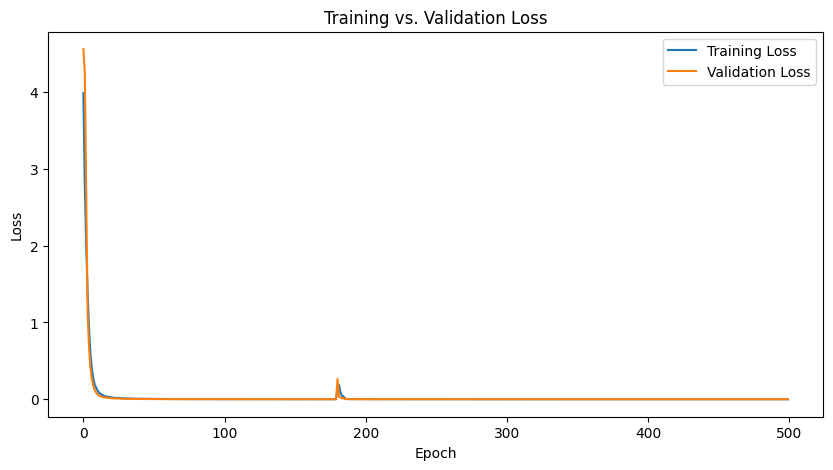

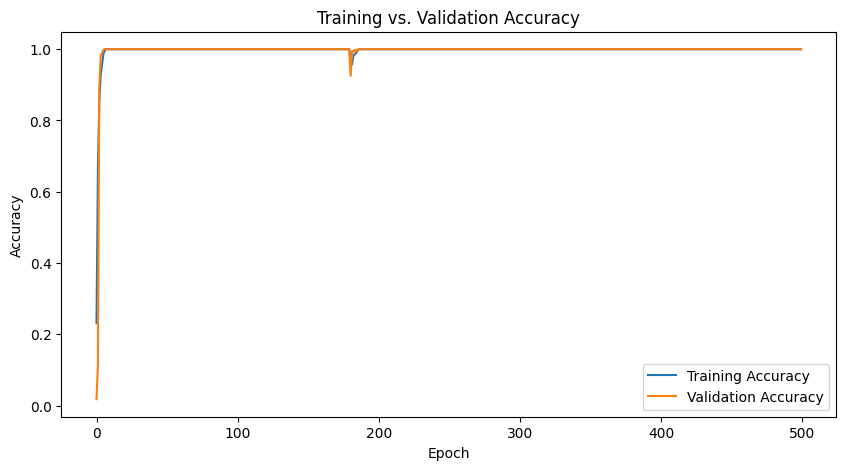

In [ ]:
def plots(train_losses, val_losses, train_accuracies, val_accuracies):
  # Loss Plot
  plt.figure(figsize=(10, 5))
  plt.plot(train_losses, label='Training Loss')
  plt.plot(val_losses, label='Validation Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend()
  plt.title('Training vs. Validation Loss')
  plt.show()

  # Accuracy Plot
  plt.figure(figsize=(10, 5))
  plt.plot(train_accuracies, label='Training Accuracy')
  plt.plot(val_accuracies, label='Validation Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend()
  plt.title('Training vs. Validation Accuracy')
  plt.show()

plots(train_losses, val_losses, train_accuracies, val_accuracies)

In [ ]:
# accuracy should be same as before, but just re-verifying
evaluate(nnModel2, X_test_tensor, y_test_tensor)

Accuracy: 98.48%


We see a spike in loss/accuracy after plateauing, I'm going to try a few different approaches to see if I can smooth this out. Changing the learning rate, possibly learning rate scheduling, implementing dropouts, and using normalized data.

In [ ]:
class MulticlassIdentifierDrops(nn.Module):
  def __init__(self, input_size, hidden_sizes, output_size):
    super(MulticlassIdentifierDrops, self).__init__()
    self.fc1 = nn.Linear(input_size, hidden_sizes[0])
    self.bn1 = nn.BatchNorm1d(hidden_sizes[0])
    self.relu1 = nn.ReLU()
    self.dropout1 = nn.Dropout(0.2) # Small dropout since we're already batch normalizing

    self.fc2 = nn.Linear(hidden_sizes[0], hidden_sizes[1])
    self.bn2 = nn.BatchNorm1d(hidden_sizes[1])
    self.relu2 = nn.ReLU()
    self.dropout2 = nn.Dropout(0.2)

    self.fc3 = nn.Linear(hidden_sizes[1], output_size)

  def forward(self, x):
    x = self.fc1(x)
    x = self.bn1(x)
    x = self.relu1(x)
    x = self.dropout1(x)

    x = self.fc2(x)
    x = self.bn2(x)
    x = self.relu2(x)
    x = self.dropout2(x)

    x = self.fc3(x)

    return x

input_size = X_train.shape[1]
hidden_sizes = [256, 128]
output_size = len(train_df['species'].unique())
nnModel3 = MulticlassIdentifierDrops(input_size, hidden_sizes, output_size).to(device)

Epoch 0/1500
Train Loss: 4.7014, Train Accuracy: 0.0114
Val Loss: 4.6081, Val Accuracy: 0.0025
Epoch 50/1500
Train Loss: 3.9720, Train Accuracy: 0.1982
Val Loss: 3.8794, Val Accuracy: 0.3081
Epoch 100/1500
Train Loss: 3.4686, Train Accuracy: 0.4470
Val Loss: 3.3578, Val Accuracy: 0.6162
Epoch 150/1500
Train Loss: 3.0548, Train Accuracy: 0.6124
Val Loss: 2.9263, Val Accuracy: 0.7601
Epoch 200/1500
Train Loss: 2.7053, Train Accuracy: 0.7336
Val Loss: 2.5267, Val Accuracy: 0.8359
Epoch 250/1500
Train Loss: 2.3983, Train Accuracy: 0.7753
Val Loss: 2.1949, Val Accuracy: 0.8826
Epoch 300/1500
Train Loss: 2.0698, Train Accuracy: 0.8333
Val Loss: 1.8820, Val Accuracy: 0.9217
Epoch 350/1500
Train Loss: 1.8163, Train Accuracy: 0.8687
Val Loss: 1.6033, Val Accuracy: 0.9407
Epoch 400/1500
Train Loss: 1.5479, Train Accuracy: 0.9116
Val Loss: 1.3590, Val Accuracy: 0.9596
Epoch 450/1500
Train Loss: 1.3392, Train Accuracy: 0.9242
Val Loss: 1.1210, Val Accuracy: 0.9710
Epoch 500/1500
Train Loss: 1.1500

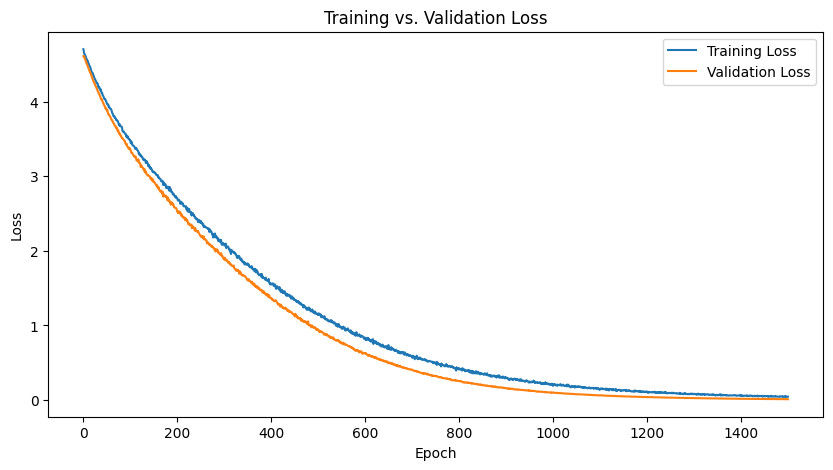

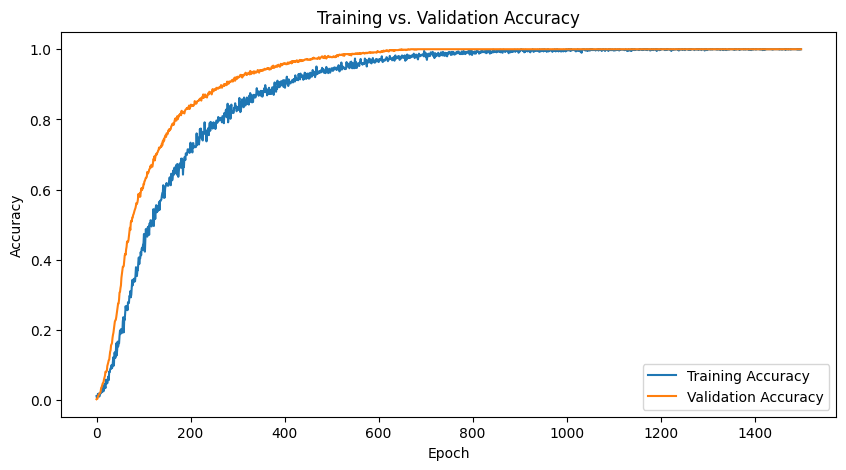

In [ ]:
nnModel3 = MulticlassIdentifierDrops(input_size, hidden_sizes, output_size).to(device)
train_losses, val_losses, train_accuracies, val_accuracies = trainAndEval(1500, nnModel3, 0.00001)
plots(train_losses, val_losses, train_accuracies, val_accuracies)

In [ ]:
evaluate(nnModel3, X_test_tensor, y_test_tensor)

Accuracy: 97.47%


The accuracy decreased, likely due to reduced overfitting. That is with dropouts, greatly decreased learning rate, but not using normalized data. Also since the learning rate is so low, the loss plateaus quite later than the accuracy. I'll implement a learning rate scheduler to hopefully have the loss converge earlier

In [ ]:
import torch.optim.lr_scheduler as lr_scheduler
def train_eval_LRScheduling(epochs, model, learning_rate):
  criterion = nn.CrossEntropyLoss()
  optimizer = optim.Adam(model.parameters(), lr=learning_rate)
  # If val_loss doesn't change after 10 epochs, decrease learning rate
  scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=10, factor=0.1)

  # Track the loss and accuracies in boht training and validation sets
  train_losses = []
  val_losses = []

  train_accuracies = []
  val_accuracies = []

  for epoch in range(epochs):
      model.train()
      train_loss = 0.0
      correct_train = 0
      total_train = 0

      for input, labels in dataloader:
          input, labels = input.to(device), labels.to(device)

          optimizer.zero_grad()
          outputs = model(input)
          loss = criterion(outputs, labels)
          loss.backward()
          optimizer.step()

          train_loss += loss.item()

          _, predicted = torch.max(outputs.data, 1)
          total_train += labels.size(0)
          correct_train += (predicted == labels).sum().item()

      train_losses.append(train_loss / len(dataloader))
      train_accuracies.append(correct_train / total_train)

      # Validation testing for overfitting
      model.eval()
      val_loss = 0.0
      correct_val = 0
      total_val = 0

      test_dataset = TensorDataset(torch.tensor(X_test.values, dtype=torch.float32), torch.tensor(y_test_encoded, dtype=torch.long))
      test_dataloader = DataLoader(dataset, batch_size=32, shuffle=False)


      with torch.no_grad():
          for input, labels in test_dataloader:
              input, labels = input.to(device), labels.to(device)

              outputs = model(input)
              loss = criterion(outputs, labels)

              val_loss += loss.item()

              _, predicted = torch.max(outputs.data, 1)
              correct_val += (predicted == labels).sum().item()
              total_val += labels.size(0)

      val_losses.append(val_loss / len(test_dataloader))
      val_accuracies.append(correct_val / total_val)

      # Decrease LR after val_loss is calculated
      scheduler.step(val_losses[-1])

      # Print progress but only do it 5 times. Added LR print to show it changing
      if epoch % (epochs // 5) == 0:
        print(f"Epoch {epoch}/{epochs}")
        print(f"Train Loss: {train_losses[-1]:.4f}, Train Accuracy: {train_accuracies[-1]:.4f}")
        print(f"Val Loss: {val_losses[-1]:.4f}, Val Accuracy: {val_accuracies[-1]:.4f}")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']}")

  return train_losses, val_losses, train_accuracies, val_accuracies

Epoch 0/600
Train Loss: 4.2729, Train Accuracy: 0.1061
Val Loss: 4.5617, Val Accuracy: 0.0265
Learning Rate: 0.001
Epoch 120/600
Train Loss: 0.0048, Train Accuracy: 1.0000
Val Loss: 0.0004, Val Accuracy: 1.0000
Learning Rate: 0.0001
Epoch 240/600
Train Loss: 0.0021, Train Accuracy: 1.0000
Val Loss: 0.0001, Val Accuracy: 1.0000
Learning Rate: 0.0001
Epoch 360/600
Train Loss: 0.0009, Train Accuracy: 1.0000
Val Loss: 0.0000, Val Accuracy: 1.0000
Learning Rate: 0.0001
Epoch 480/600
Train Loss: 0.0007, Train Accuracy: 1.0000
Val Loss: 0.0000, Val Accuracy: 1.0000
Learning Rate: 1.0000000000000004e-08


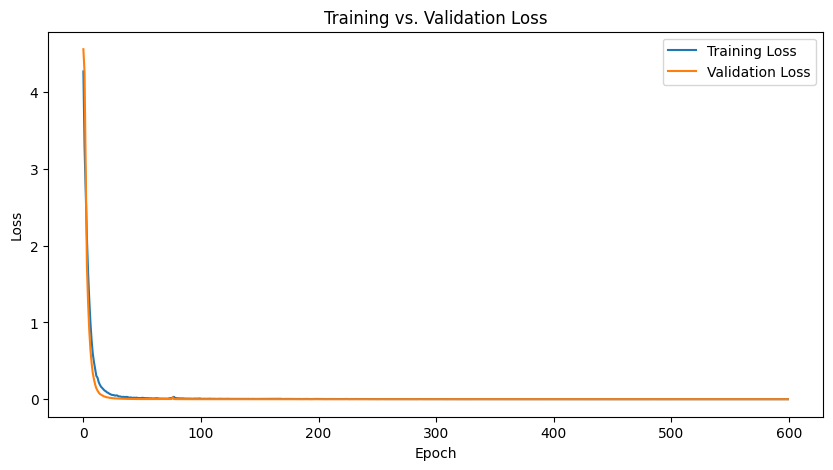

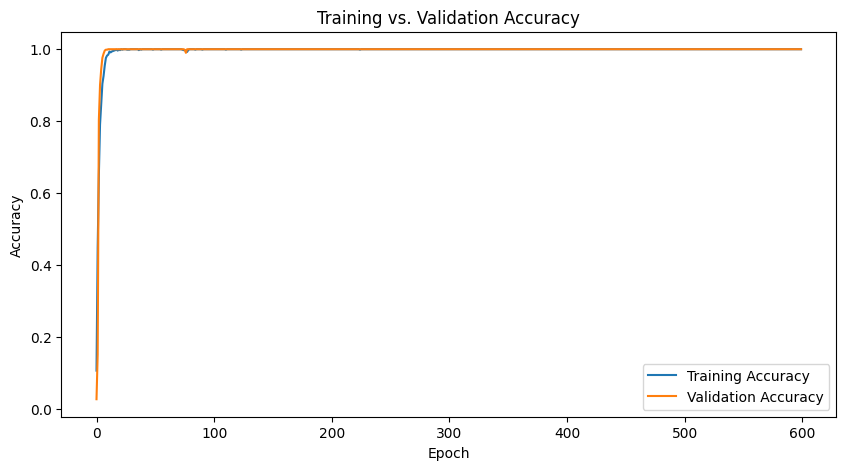

In [ ]:
nnModel3 = MulticlassIdentifierDrops(input_size, hidden_sizes, output_size).to(device)
train_losses, val_losses, train_accuracies, val_accuracies = train_eval_LRScheduling(600, nnModel3, 0.001)
plots(train_losses, val_losses, train_accuracies, val_accuracies)

In [ ]:
evaluate(nnModel3, X_test_tensor, y_test_tensor)

Accuracy: 97.47%


I'm able to achieve a really good accuracy here, occassionally achieving **98.99%** but it converges very fast. This is likely overfitting. I'm going to change the learning rate scheduling to instead of changing when validation loss stops changing to instead just step decay. I'll explore using a cosine annealing as I read its useful for problems with high-dimensional parameter spaces or noisy gradients.

In [ ]:
import torch.optim.lr_scheduler as lr_scheduler
def train_eval_LRScheduling(epochs, model, learning_rate, scheduler_type='step'):
  criterion = nn.CrossEntropyLoss()
  optimizer = optim.Adam(model.parameters(), lr=learning_rate)

  # Defaults to step
  if scheduler_type == 'step':
      # StepLR scheduler: Step decay every 100 epochs
      scheduler = lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.1)
  elif scheduler_type == 'cosine':
      # CosineAnnealingLR scheduler
      scheduler = lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-6)

  # Track the loss and accuracies in boht training and validation sets
  train_losses = []
  val_losses = []

  train_accuracies = []
  val_accuracies = []

  for epoch in range(epochs):
      model.train()
      train_loss = 0.0
      correct_train = 0
      total_train = 0

      for input, labels in dataloader:
          input, labels = input.to(device), labels.to(device)

          optimizer.zero_grad()
          outputs = model(input)
          loss = criterion(outputs, labels)
          loss.backward()
          optimizer.step()

          train_loss += loss.item()

          _, predicted = torch.max(outputs.data, 1)
          total_train += labels.size(0)
          correct_train += (predicted == labels).sum().item()

      train_losses.append(train_loss / len(dataloader))
      train_accuracies.append(correct_train / total_train)

      # Validation testing for overfitting
      model.eval()
      val_loss = 0.0
      correct_val = 0
      total_val = 0

      test_dataset = TensorDataset(torch.tensor(X_test.values, dtype=torch.float32), torch.tensor(y_test_encoded, dtype=torch.long))
      test_dataloader = DataLoader(dataset, batch_size=32, shuffle=False)


      with torch.no_grad():
          for input, labels in test_dataloader:
              input, labels = input.to(device), labels.to(device)

              outputs = model(input)
              loss = criterion(outputs, labels)

              val_loss += loss.item()

              _, predicted = torch.max(outputs.data, 1)
              correct_val += (predicted == labels).sum().item()
              total_val += labels.size(0)

      val_losses.append(val_loss / len(test_dataloader))
      val_accuracies.append(correct_val / total_val)

      # Scheduler step. Could be either cosine annealing or just steps
      scheduler.step()

      # Print progress but only do it 5 times. Added LR print to show it changing
      if epoch % (epochs // 5) == 0:
        print(f"Epoch {epoch}/{epochs}")
        print(f"Train Loss: {train_losses[-1]:.4f}, Train Accuracy: {train_accuracies[-1]:.4f}")
        print(f"Val Loss: {val_losses[-1]:.4f}, Val Accuracy: {val_accuracies[-1]:.4f}")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']}")

  return train_losses, val_losses, train_accuracies, val_accuracies

Epoch 0/600
Train Loss: 4.2640, Train Accuracy: 0.1136
Val Loss: 4.5467, Val Accuracy: 0.0467
Learning Rate: 0.001
Epoch 120/600
Train Loss: 0.0041, Train Accuracy: 1.0000
Val Loss: 0.0002, Val Accuracy: 1.0000
Learning Rate: 0.0001
Epoch 240/600
Train Loss: 0.0019, Train Accuracy: 1.0000
Val Loss: 0.0001, Val Accuracy: 1.0000
Learning Rate: 1e-05
Epoch 360/600
Train Loss: 0.0018, Train Accuracy: 1.0000
Val Loss: 0.0001, Val Accuracy: 1.0000
Learning Rate: 1.0000000000000002e-06
Epoch 480/600
Train Loss: 0.0015, Train Accuracy: 1.0000
Val Loss: 0.0001, Val Accuracy: 1.0000
Learning Rate: 1.0000000000000002e-07


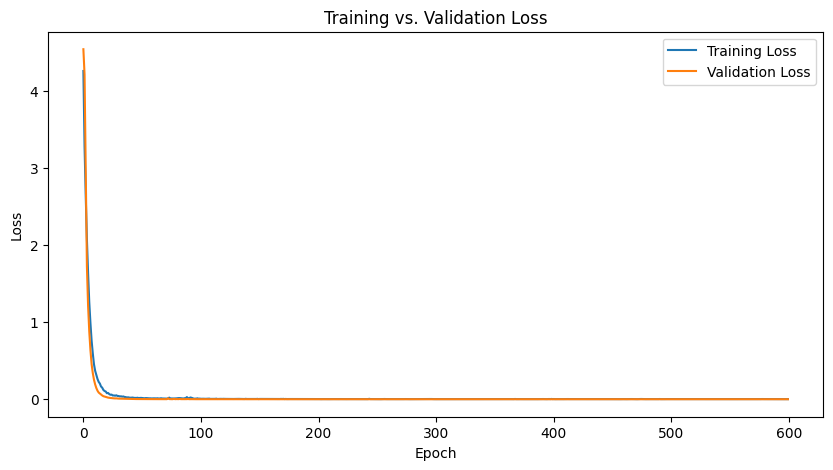

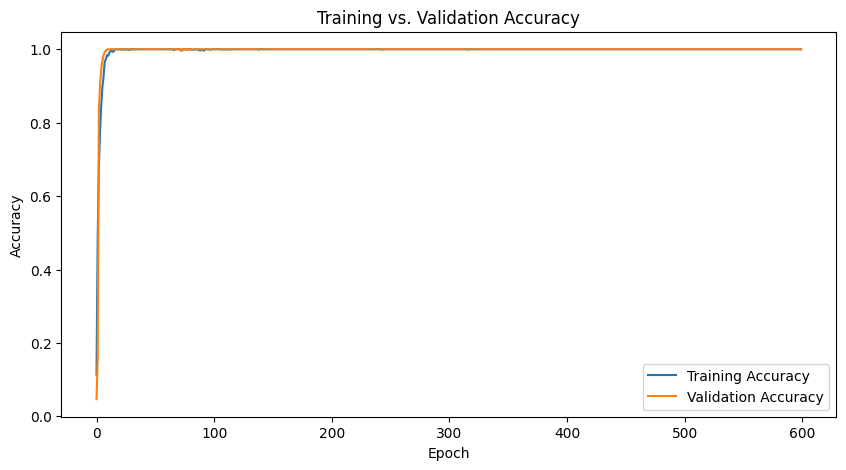

In [ ]:
nnModel3 = MulticlassIdentifierDrops(input_size, hidden_sizes, output_size).to(device)
train_losses, val_losses, train_accuracies, val_accuracies = train_eval_LRScheduling(600, nnModel3, 0.001, 'step')
plots(train_losses, val_losses, train_accuracies, val_accuracies)

In [ ]:
evaluate(nnModel3, X_test_tensor, y_test_tensor)

Accuracy: 98.99%


Epoch 0/2000
Train Loss: 4.6191, Train Accuracy: 0.0114
Val Loss: 4.6003, Val Accuracy: 0.0126
Learning Rate: 4.999996977434274e-05
Epoch 400/2000
Train Loss: 0.0325, Train Accuracy: 1.0000
Val Loss: 0.0073, Val Accuracy: 1.0000
Learning Rate: 4.529827129099463e-05
Epoch 800/2000
Train Loss: 0.0026, Train Accuracy: 1.0000
Val Loss: 0.0002, Val Accuracy: 1.0000
Learning Rate: 3.303430609297789e-05
Epoch 1200/2000
Train Loss: 0.0007, Train Accuracy: 1.0000
Val Loss: 0.0000, Val Accuracy: 1.0000
Learning Rate: 1.7892492049088958e-05
Epoch 1600/2000
Train Loss: 0.0003, Train Accuracy: 1.0000
Val Loss: 0.0000, Val Accuracy: 1.0000
Learning Rate: 5.656487472763026e-06


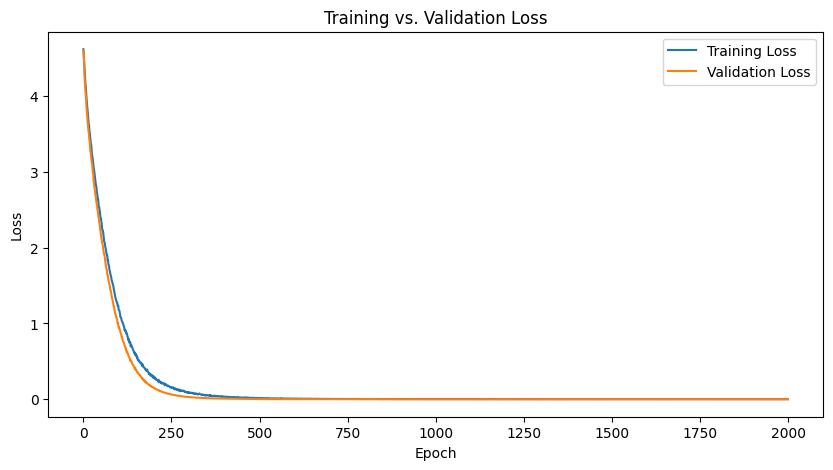

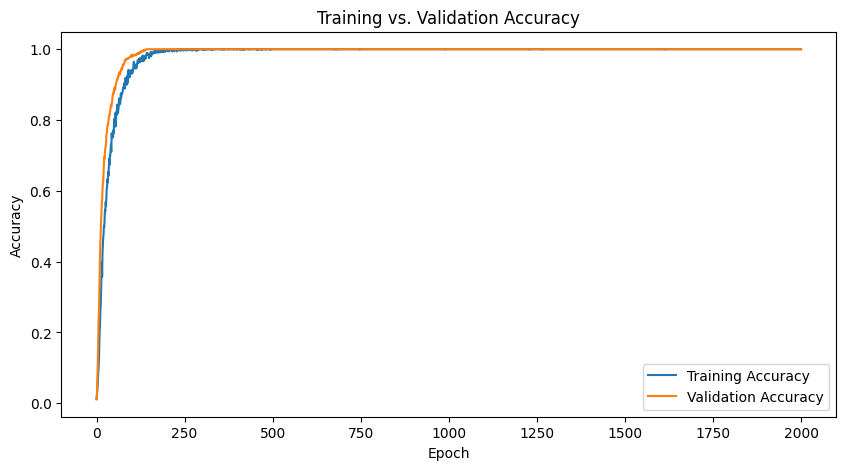

In [ ]:
nnModel3 = MulticlassIdentifierDrops(input_size, hidden_sizes, output_size).to(device)
# I'm running the cosine model with many epochs since it should have more (and starting on lower learning rate)
train_losses, val_losses, train_accuracies, val_accuracies = train_eval_LRScheduling(2000, nnModel3, 0.00005, 'cosine')
plots(train_losses, val_losses, train_accuracies, val_accuracies)

In [ ]:
evaluate(nnModel3, X_test_tensor, y_test_tensor)

Accuracy: 98.48%


# **Model Evaluation**

**Final Model**

For this model, we chose to show the classification report on one training cycle. However, we wanted a representation of all labels in our confusion matrix, so we created five iterations of our model training and appended them together.

Random Forests:

In [ ]:
#Performing the data split of the dataframes for Random Forests
X_transformed = transformed_df.drop(columns=['species'])
y = transformed_df['species']

X_train_transformed, X_test_transformed, y_train_transformed, y_test_transformed = train_test_split(X_transformed, y, test_size=0.2, random_state=42)

#Model tuned from the hyperparameter training performed above using Grid Search
rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    min_samples_leaf=1,
    min_samples_split=2,
    random_state=42
    )

#Train the model
rf_model.fit(X_train_transformed, y_train_transformed)

#Predict on the test set
y_pred_transformed = rf_model.predict(X_test_transformed)

print("\nClassification Report:")
print(classification_report(y_test_transformed, y_pred_transformed))


Classification Report:
                              precision    recall  f1-score   support

             Acer_Capillipes       1.00      1.00      1.00         1
                   Acer_Mono       1.00      1.00      1.00         2
                 Acer_Pictum       1.00      1.00      1.00         3
             Acer_Platanoids       1.00      1.00      1.00         1
            Acer_Saccharinum       1.00      1.00      1.00         3
               Alnus_Cordata       1.00      1.00      1.00         3
          Alnus_Maximowiczii       1.00      1.00      1.00         3
                 Alnus_Rubra       1.00      1.00      1.00         1
           Alnus_Sieboldiana       0.67      1.00      0.80         2
               Alnus_Viridis       1.00      1.00      1.00         2
         Arundinaria_Simonii       1.00      1.00      1.00         2
       Betula_Austrosinensis       1.00      1.00      1.00         1
              Betula_Pendula       1.00      1.00      1.00      

In [ ]:
y_true_accumulated = []
y_pred_accumulated = []
acc = []
rec = []
prec = []
f1 = []

# Repeat the model training and testing process 5 times
for i in range(5):
    print(f"Iteration {i+1}")

    # Split the data
    X_train_transformed, X_test_transformed, y_train_transformed, y_test_transformed = train_test_split(X_transformed, y, test_size=0.2, random_state=(42+i))

    # Train the model
    rf_model.fit(X_train_transformed, y_train_transformed)

    # Predict on the test set
    y_pred_transformed = rf_model.predict(X_test_transformed)

    # Accumulate the true and predicted labels
    y_true_accumulated.extend(y_test_transformed)
    y_pred_accumulated.extend(y_pred_transformed)

    acc.append(accuracy_score(y_test_transformed, y_pred_transformed))
    prec.append(precision_score(y_test_transformed, y_pred_transformed, average='macro'))
    rec.append(recall_score(y_test_transformed, y_pred_transformed, average='macro'))
    f1.append(f1_score(y_test_transformed, y_pred_transformed, average='macro'))

avgAcc = sum(acc) / len(acc)
avgPrec = sum(prec) / len(prec)
avgRec = sum(rec) / len(rec)
avgF1 = sum(f1) / len(f1)

print(f"Average Accuracy: {avgAcc * 100:.2f}%")
print(f"Average Precision: {avgPrec * 100:.2f}%")
print(f"Average Recall: {avgRec * 100:.2f}%")
print(f"Average F1 Score: {avgF1 * 100:.2f}%")
# Build the confusion matrix using all accumulated predictions and true labels
cm = confusion_matrix(y_true_accumulated, y_pred_accumulated)

# Visualize the confusion matrix
plt.figure(figsize=(36, 36), dpi=480)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=rf_model.classes_, yticklabels=rf_model.classes_)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix (Aggregated over 5 Runs)')
plt.show()

Iteration 1
Iteration 2
Iteration 3
Iteration 4
Iteration 5
Average Accuracy: 96.46%
Average Precision: 96.21%
Average Recall: 96.26%
Average F1 Score: 95.52%


Neural Network:

In [ ]:
import torch.optim.lr_scheduler as lr_scheduler
class MulticlassIdentifierDrops(nn.Module):
  def __init__(self, input_size, hidden_sizes, output_size):
    super(MulticlassIdentifierDrops, self).__init__()
    self.fc1 = nn.Linear(input_size, hidden_sizes[0])
    self.bn1 = nn.BatchNorm1d(hidden_sizes[0])
    self.relu1 = nn.ReLU()
    self.dropout1 = nn.Dropout(0.2) # Small dropout since we're already batch normalizing

    self.fc2 = nn.Linear(hidden_sizes[0], hidden_sizes[1])
    self.bn2 = nn.BatchNorm1d(hidden_sizes[1])
    self.relu2 = nn.ReLU()
    self.dropout2 = nn.Dropout(0.2)

    self.fc3 = nn.Linear(hidden_sizes[1], output_size)

  def forward(self, x):
    x = self.fc1(x)
    x = self.bn1(x)
    x = self.relu1(x)
    x = self.dropout1(x)

    x = self.fc2(x)
    x = self.bn2(x)
    x = self.relu2(x)
    x = self.dropout2(x)

    x = self.fc3(x)

    return x

def train_eval_LRScheduling(epochs, model, learning_rate):
  criterion = nn.CrossEntropyLoss()
  optimizer = optim.Adam(model.parameters(), lr=learning_rate)
  # If val_loss doesn't change after 10 epochs, decrease learning rate
  scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=10, factor=0.1)

  # Track the loss and accuracies in boht training and validation sets
  train_losses = []
  val_losses = []

  train_accuracies = []
  val_accuracies = []

  for epoch in range(epochs):
      model.train()
      train_loss = 0.0
      correct_train = 0
      total_train = 0

      for input, labels in dataloader:
          input, labels = input.to(device), labels.to(device)

          optimizer.zero_grad()
          outputs = model(input)
          loss = criterion(outputs, labels)
          loss.backward()
          optimizer.step()

          train_loss += loss.item()

          _, predicted = torch.max(outputs.data, 1)
          total_train += labels.size(0)
          correct_train += (predicted == labels).sum().item()

      train_losses.append(train_loss / len(dataloader))
      train_accuracies.append(correct_train / total_train)

      # Validation testing for overfitting
      model.eval()
      val_loss = 0.0
      correct_val = 0
      total_val = 0

      test_dataset = TensorDataset(torch.tensor(X_test.values, dtype=torch.float32), torch.tensor(y_test_encoded, dtype=torch.long))
      test_dataloader = DataLoader(dataset, batch_size=32, shuffle=False)


      with torch.no_grad():
          for input, labels in test_dataloader:
              input, labels = input.to(device), labels.to(device)

              outputs = model(input)
              loss = criterion(outputs, labels)

              val_loss += loss.item()

              _, predicted = torch.max(outputs.data, 1)
              correct_val += (predicted == labels).sum().item()
              total_val += labels.size(0)

      val_losses.append(val_loss / len(test_dataloader))
      val_accuracies.append(correct_val / total_val)

      # Decrease LR after val_loss is calculated
      scheduler.step(val_losses[-1])

      # Print progress but only do it 5 times. Added LR print to show it changing
      if epoch % (epochs // 5) == 0:
        print(f"Epoch {epoch}/{epochs}")
        print(f"Train Loss: {train_losses[-1]:.4f}, Train Accuracy: {train_accuracies[-1]:.4f}")
        print(f"Val Loss: {val_losses[-1]:.4f}, Val Accuracy: {val_accuracies[-1]:.4f}")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']}")

  return train_losses, val_losses, train_accuracies, val_accuracies

  def evaluate(model, X_test, y_test):
    model.eval()

    with torch.no_grad():
        y_pred = model(X_test)

    _, predicted_labels = torch.max(y_pred, 1)
    correct = (predicted_labels == y_test).sum().item()
    total = y_test.size(0)
    accuracy = correct / total * 100

    print(f'Accuracy: {accuracy:.2f}%')


input_size = X_train.shape[1]
hidden_sizes = [256, 128]
output_size = len(train_df['species'].unique())
nnModel3 = MulticlassIdentifierDrops(input_size, hidden_sizes, output_size).to(device)
train_eval_LRScheduling(600, nnModel3, 0.001)
evaluate(nnModel3, X_test_tensor, y_test_tensor)

Epoch 0/600
Train Loss: 4.2155, Train Accuracy: 0.1389
Val Loss: 4.5543, Val Accuracy: 0.0126
Learning Rate: 0.001
Epoch 120/600
Train Loss: 0.0055, Train Accuracy: 1.0000
Val Loss: 0.0003, Val Accuracy: 1.0000
Learning Rate: 0.0001
Epoch 240/600
Train Loss: 0.0018, Train Accuracy: 1.0000
Val Loss: 0.0001, Val Accuracy: 1.0000
Learning Rate: 0.0001
Epoch 360/600
Train Loss: 0.0007, Train Accuracy: 1.0000
Val Loss: 0.0000, Val Accuracy: 1.0000
Learning Rate: 0.0001
Epoch 480/600
Train Loss: 0.0004, Train Accuracy: 1.0000
Val Loss: 0.0000, Val Accuracy: 1.0000
Learning Rate: 1e-05
Accuracy: 98.48%
